<a href="https://colab.research.google.com/github/MuBuBaamm/EfficientNet/blob/main/train_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install tensorflow

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [2]:
from google.colab import drive

drive.mount ('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
cd '/content/drive/MyDrive/dataset_split'

/content/drive/MyDrive/dataset_split/train


In [4]:
ls

 Artifact/               'Enterobius vermicularis'/  'Opisthorchis viverini'/
'Ascaris lumbricoides'/   Hookworms/                 'Taenia spp'/
'Echinostoma spp'/       'Minute Intestinal Fluke'/  'Trichuris trichiura'/


In [5]:
import pathlib

dataset_parasite = ('/content/drive/MyDrive/dataset_split/train')
data_dir = pathlib.Path(dataset_parasite)

In [6]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)

365


In [7]:
batch_size = 64
img_height = 224
img_width = 224

In [8]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_parasite,
    validation_split=0.1,
    subset="training",
    seed=123,
    image_size=(img_height,img_width),
    batch_size=batch_size
)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_parasite,
    validation_split=0.1,
    subset="validation",
    seed=123,
    image_size=(img_height,img_width),
    batch_size=batch_size
)

Found 365 files belonging to 9 classes.
Using 329 files for training.
Found 365 files belonging to 9 classes.
Using 36 files for validation.


In [9]:
class_names = train_ds.class_names
print(class_names)

['Artifact', 'Ascaris lumbricoides', 'Echinostoma spp', 'Enterobius vermicularis', 'Hookworms', 'Minute Intestinal Fluke', 'Opisthorchis viverini', 'Taenia spp', 'Trichuris trichiura']


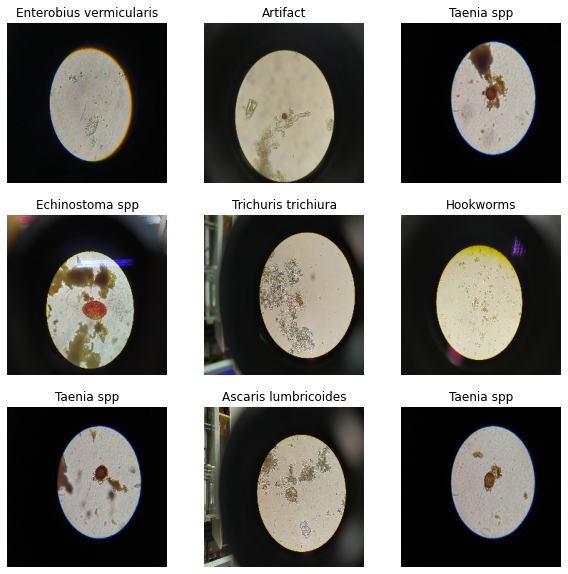

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [11]:
from tensorflow.keras.models import Sequential

data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomFlip(),
        layers.experimental.preprocessing.RandomRotation(0.15),
        layers.experimental.preprocessing.RandomTranslation(height_factor=0.1, width_factor=0.1),
        layers.experimental.preprocessing.RandomContrast(factor=0.1)
    ]
)

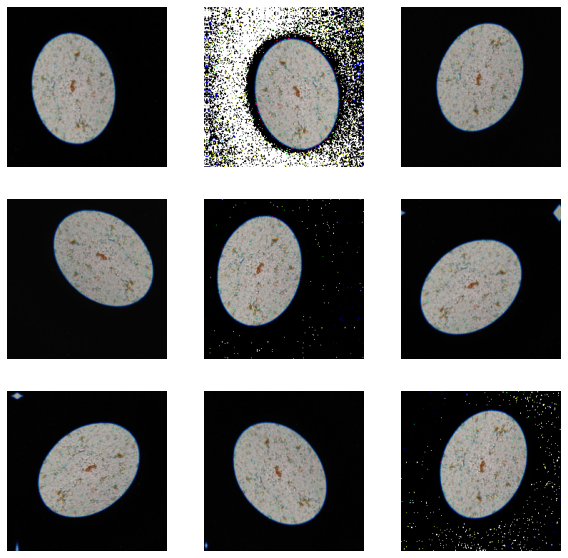

In [12]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

In [13]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
    print("Running on TPU ", tpu.cluster_spec().as_dict()["worker"])
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except ValueError:
    print("Not connected to a TPU runtime. Using CPU/GPU strategy")
    strategy = tf.distribute.MirroredStrategy()

Not connected to a TPU runtime. Using CPU/GPU strategy
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [14]:
NUM_CLASSES = len(list(class_names))
print(NUM_CLASSES)

9


In [15]:
def input_preprocess(images, labels):
    labels = tf.one_hot(labels, NUM_CLASSES)
    return images, labels

    augmented_train_ds = train_ds.map(input_preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    
    train_ds = train_ds.batch(batch_size=batch_size, drop_remainder=True)
    train_ds = train_ds.prefetch(tf.data.experimental.AUTOTUNE)

    val_ds = val_ds.map(input_preprocess)
    val_ds = val_ds.batch(batch_size=batch_size, drop_remainder=True)
    val_ds = train_ds.prefetch(tf.data.experimental.AUTOTUNE)

In [16]:
from tensorflow.keras.applications import EfficientNetB0

with strategy.scope():
    inputs = layers.Input(shape=(img_height,img_width, 3))
    x = data_augmentation(inputs)
    outputs = EfficientNetB0(include_top=True, weights=None, classes=NUM_CLASSES)(x)

    model = tf.keras.Model(inputs, outputs)
    model.compile(
        optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"]
    )

model.summary()

epochs = 40  # @param {type: "slider", min:10, max:100}
hist = model.fit(train_ds, epochs=epochs, validation_data=val_ds, verbose=2)

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Redu

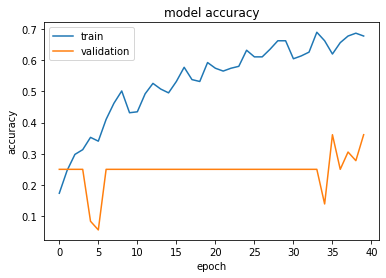

In [17]:
import matplotlib.pyplot as plt

def plot_hist(hist):
    plt.plot(hist.history["accuracy"])
    plt.plot(hist.history["val_accuracy"])
    plt.title("model accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epoch")
    plt.legend(["train", "validation"], loc="upper left")
    plt.show()

plot_hist(hist)

In [18]:
from tensorflow.keras.layers.experimental import preprocessing


def build_model(num_classes):
    inputs = layers.Input(shape=(img_height,img_width, 3))
    x = data_augmentation(inputs)
    model = EfficientNetB0(include_top=False, input_tensor=x, weights="imagenet")

    # Freeze the pretrained weights
    model.trainable = False

    # Rebuild top
    x = layers.GlobalAveragePooling2D(name="avg_pool")(model.output)
    x = layers.BatchNormalization()(x)

    top_dropout_rate = 0.2
    x = layers.Dropout(top_dropout_rate, name="top_dropout")(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax", name="pred")(x)

    # Compile
    model = tf.keras.Model(inputs, outputs, name="EfficientNet")
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-2)
    model.compile(
        optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"]
    )
    return model

16711680/16705208 [==============================] - 0s 0us/step
Epoch 1/25
6/6 - 56s - loss: 1.9086 - accuracy: 0.5289 - val_loss: 1.3915 - val_accuracy: 0.5556
Epoch 2/25
6/6 - 47s - loss: 0.9024 - accuracy: 0.8085 - val_loss: 1.2783 - val_accuracy: 0.5278
Epoch 3/25
6/6 - 47s - loss: 1.1448 - accuracy: 0.8055 - val_loss: 1.6273 - val_accuracy: 0.5556
Epoch 4/25
6/6 - 47s - loss: 0.6645 - accuracy: 0.8602 - val_loss: 1.5543 - val_accuracy: 0.5833
Epoch 5/25
6/6 - 47s - loss: 0.4677 - accuracy: 0.8784 - val_loss: 1.6304 - val_accuracy: 0.6111
Epoch 6/25
6/6 - 47s - loss: 0.6093 - accuracy: 0.8207 - val_loss: 1.7542 - val_accuracy: 0.5278
Epoch 7/25
6/6 - 47s - loss: 0.5000 - accuracy: 0.8875 - val_loss: 1.5253 - val_accuracy: 0.5278
Epoch 8/25
6/6 - 47s - loss: 0.4765 - accuracy: 0.8845 - val_loss: 1.3798 - val_accuracy: 0.6111
Epoch 9/25
6/6 - 46s - loss: 0.5227 - accuracy: 0.8754 - val_loss: 1.1516 - val_accuracy: 0.6111
Epoch 10/25
6/6 - 46s - loss: 0.3469 - accuracy: 0.9119 - val_

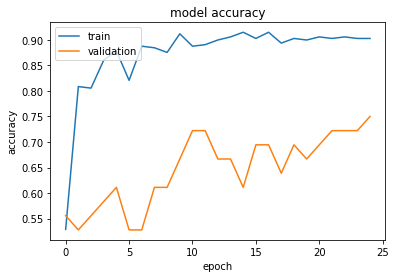

In [19]:
with strategy.scope():
    model = build_model(num_classes=NUM_CLASSES)

epochs = 25  # @param {type: "slider", min:8, max:80}
hist = model.fit(train_ds, epochs=epochs, validation_data=val_ds, verbose=2)
plot_hist(hist)

Epoch 1/10
6/6 - 56s - loss: 0.2780 - accuracy: 0.9240 - val_loss: 1.4025 - val_accuracy: 0.6944
Epoch 2/10
6/6 - 46s - loss: 0.2072 - accuracy: 0.9301 - val_loss: 1.6656 - val_accuracy: 0.7222
Epoch 3/10
6/6 - 46s - loss: 0.2813 - accuracy: 0.9271 - val_loss: 1.7275 - val_accuracy: 0.7222
Epoch 4/10
6/6 - 46s - loss: 0.2088 - accuracy: 0.9210 - val_loss: 1.7102 - val_accuracy: 0.7222
Epoch 5/10
6/6 - 46s - loss: 0.2112 - accuracy: 0.9422 - val_loss: 1.5690 - val_accuracy: 0.7500
Epoch 6/10
6/6 - 46s - loss: 0.1546 - accuracy: 0.9635 - val_loss: 1.4406 - val_accuracy: 0.7222
Epoch 7/10
6/6 - 46s - loss: 0.2554 - accuracy: 0.9453 - val_loss: 1.3434 - val_accuracy: 0.7778
Epoch 8/10
6/6 - 46s - loss: 0.2280 - accuracy: 0.9422 - val_loss: 1.2888 - val_accuracy: 0.7778
Epoch 9/10
6/6 - 46s - loss: 0.1828 - accuracy: 0.9453 - val_loss: 1.3282 - val_accuracy: 0.7778
Epoch 10/10
6/6 - 46s - loss: 0.1821 - accuracy: 0.9574 - val_loss: 1.3541 - val_accuracy: 0.7500


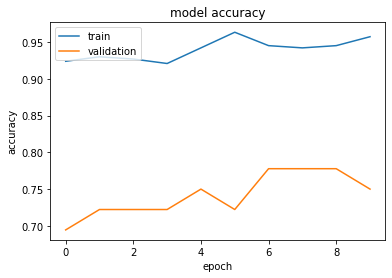

In [20]:
def unfreeze_model(model):
    # We unfreeze the top 20 layers while leaving BatchNorm layers frozen
    for layer in model.layers[-20:]:
        if not isinstance(layer, layers.BatchNormalization):
            layer.trainable = True

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
    model.compile(
        optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"]
    )


unfreeze_model(model)

epochs = 10  # @param {type: "slider", min:8, max:50}
hist = model.fit(train_ds, epochs=epochs, validation_data=val_ds, verbose=2)
plot_hist(hist)

# TEST

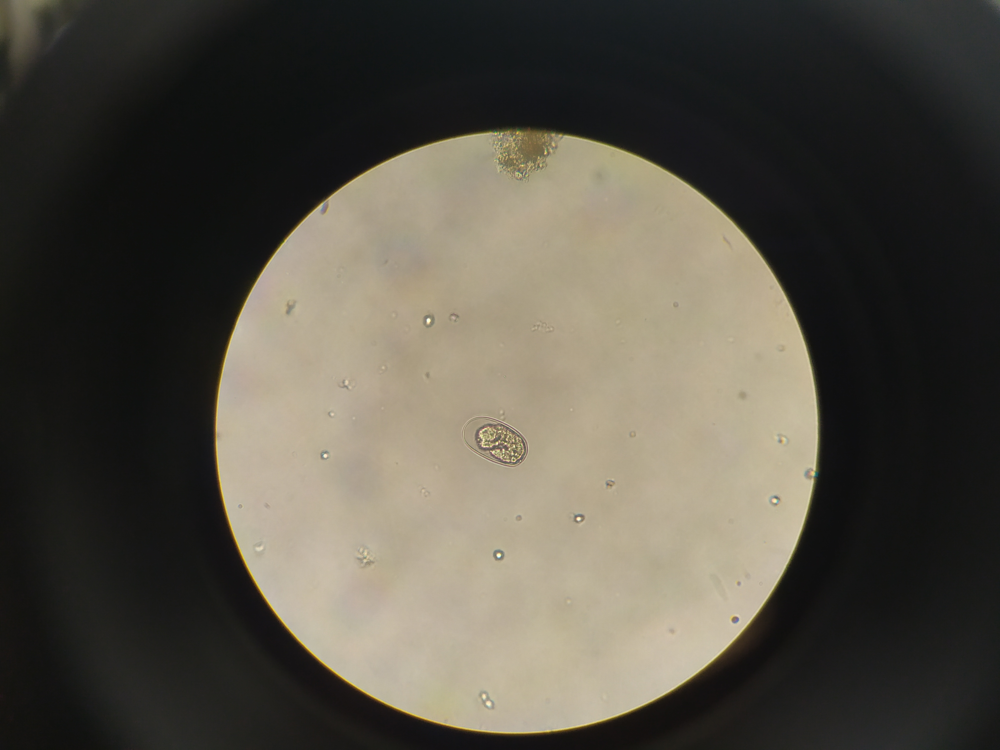

Trichuris trichiura 23.73 %


In [21]:
import numpy as np
from IPython.display import Image

path = '/content/drive/My Drive/dataset_split/test/Hookworms/IMG_20200207_110222.jpg'
img = keras.preprocessing.image.load_img(path, target_size=(224, 224))
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)
predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])
display(Image(filename=path))
print("{} {:.2f} %".format(class_names[np.argmax(score)], 100 * np.max(score)))

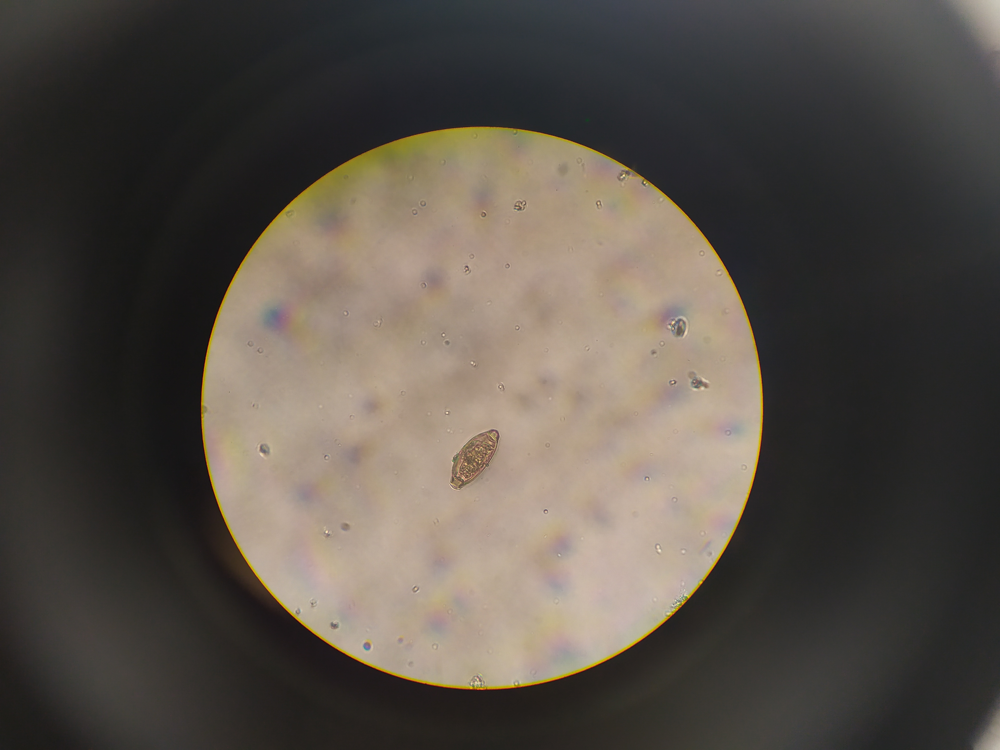

Hookworms 20.56 %


In [22]:
path = '/content/drive/My Drive/dataset_split/test/Trichuris/IMG_20200207_120247.jpg'
img = keras.preprocessing.image.load_img(path, target_size=(224, 224))
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)
predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])
display(Image(filename=path))
print("{} {:.2f} %".format(class_names[np.argmax(score)], 100 * np.max(score)))

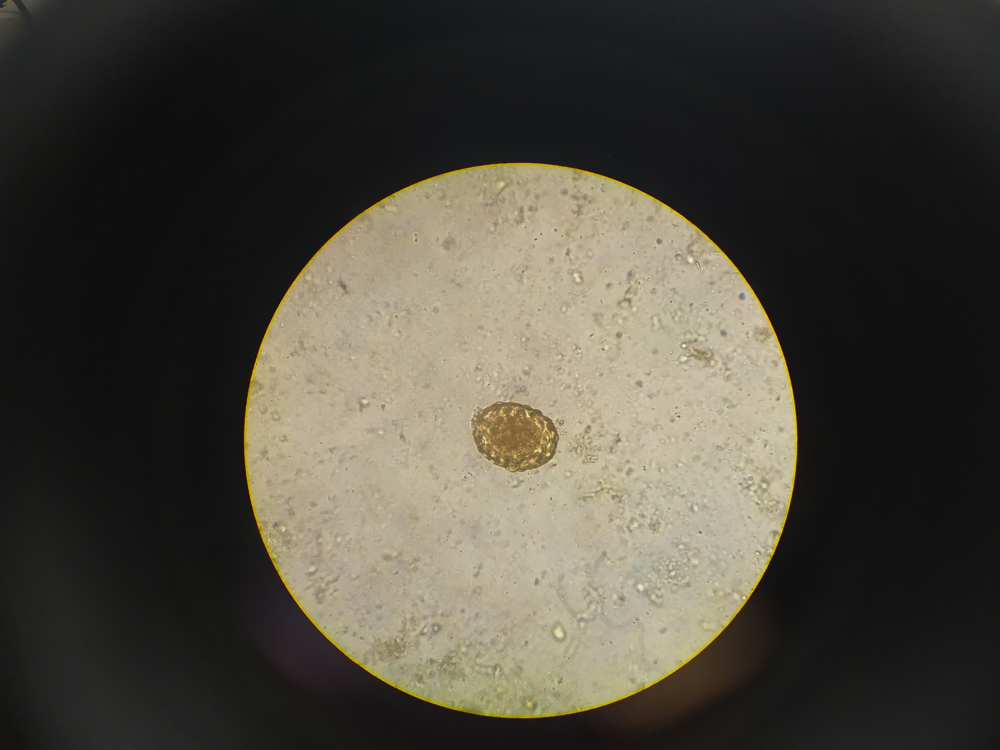

Artifact 24.35 %


In [23]:
path = '/content/drive/My Drive/dataset_split/test/Ascaris/IMG_20200207_104035.jpg'
img = keras.preprocessing.image.load_img(path, target_size=(224, 224))
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)
predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])
display(Image(filename=path))
print("{} {:.2f} %".format(class_names[np.argmax(score)], 100 * np.max(score)))

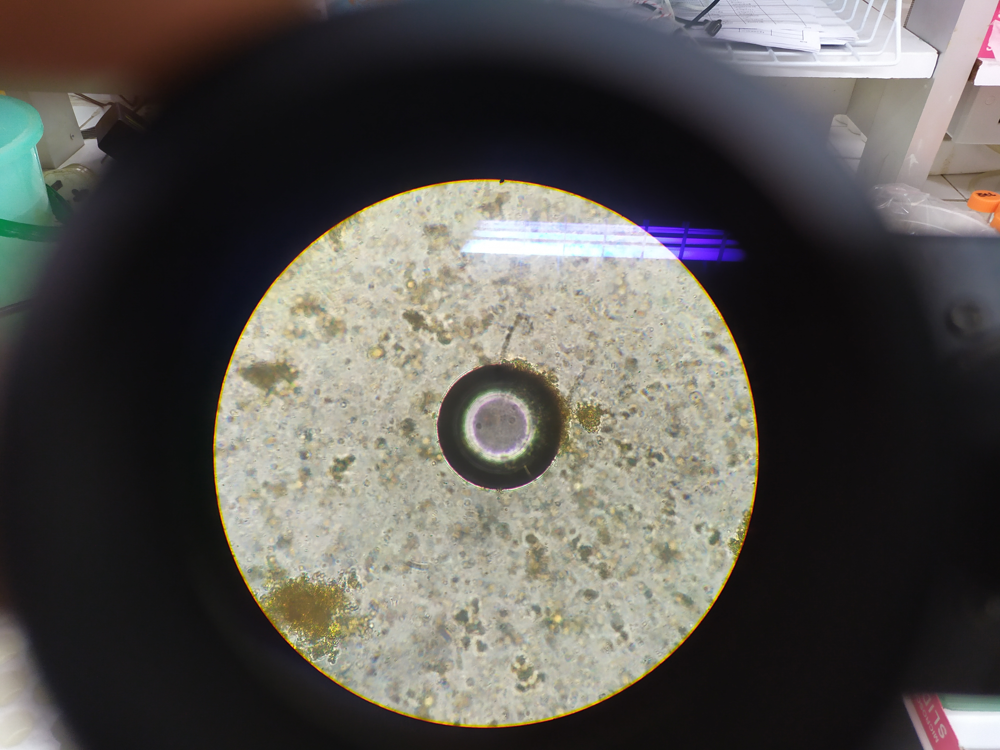

Artifact 14.71 %


In [24]:
path = '/content/drive/My Drive/dataset_split/test/Artifact/IMG_20200131_140211.jpg'
img = keras.preprocessing.image.load_img(path, target_size=(224, 224))
img_array = keras.preprocessing.image.img_to_array(img)
img_array = tf.expand_dims(img_array, 0)
predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])
display(Image(filename=path))
print("{} {:.2f} %".format(class_names[np.argmax(score)], 100 * np.max(score)))

# SAVE MODEL

In [25]:
model_json = model.to_json()
with open("model.json", "w") as json_file :
 json_file.write(model_json)

model.save_weights("model.h5")
print("Saved model to disk")

model.save('efficientnet.model')

Saved model to disk
INFO:tensorflow:Assets written to: efficientnet.model/assets
